##Load Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Copy datasets
!cp /content/drive/MyDrive/Datata/Lab5.zip .

In [4]:
 !unzip '/content/drive/MyDrive/Datata/Lab5.zip' -d '/content/'

Streaming output truncated to the last 5000 lines.
  inflating: /content/augmented/sunny/s3809_hflip.jpeg  
  inflating: /content/augmented/sunny/s3809_rot45.jpeg  
  inflating: /content/augmented/sunny/s3809_shx20.jpeg  
  inflating: /content/augmented/sunny/s3809_zm120pct.jpeg  
  inflating: /content/augmented/sunny/s3810_hflip.jpeg  
  inflating: /content/augmented/sunny/s3810_rot45.jpeg  
  inflating: /content/augmented/sunny/s3810_shx20.jpeg  
  inflating: /content/augmented/sunny/s3810_zm120pct.jpeg  
  inflating: /content/augmented/sunny/s3811_rot45.jpeg  
  inflating: /content/augmented/sunny/s3811_shx20.jpeg  
  inflating: /content/augmented/sunny/s3811_zm120pct.jpeg  
  inflating: /content/augmented/sunny/s3812_hflip.jpeg  
  inflating: /content/augmented/sunny/s3812_shx20.jpeg  
  inflating: /content/augmented/sunny/s3813_hflip.jpeg  
  inflating: /content/augmented/sunny/s3813_shx20.jpeg  
  inflating: /content/augmented/sunny/s3813_zm120pct.jpeg  
  inflating: /content/aug

#Install Timm

In [5]:
# Install Timm (Need to restart the runtime after finish install )
!pip install git+https://github.com/rwightman/pytorch-image-models.git
!pip install lightning transformers datasets evaluate pillow

  Cloning https://github.com/rwightman/pytorch-image-models.git to /tmp/pip-req-build-3egdgocr
  Running command git clone --filter=blob:none --quiet https://github.com/rwightman/pytorch-image-models.git /tmp/pip-req-build-3egdgocr
  Resolved https://github.com/rwightman/pytorch-image-models.git to commit 954613a470652e4a113ff45b62dbd15c4e229218
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for timm: filename=timm-1.0.20.dev0-py3-none-any.whl size=2498355 sha256=69890253b52730ebf1cd72c9326c54146e9c7930d27b27e430472bf4b80b5cc3
  Stored in directory: /tmp/pip-ephem-wheel-cache-bpfhqdmx/wheels/62/3c/74/390e961b002559b53451e6fb321c0865417204fd65d3becc9d
Successfully built timm
  Attempting uninstall: timm
    Found existing installation: timm 1.0.19
    Uninstalling timm-1.0.19:
      Successfully uninstalled timm-1.0.19
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.2/825.2 kB 17.3 MB

In [6]:
!pip install scikit-learn

In [7]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import DataLoader, random_split, Dataset

# Pytorch Image model (TIMM) library: a library for state-of-the-art image classification
import timm
import timm.optim
import timm.scheduler
from timm.data import ImageDataset, create_dataset, create_loader
from timm.data.transforms_factory import create_transform

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from PIL import Image

import evaluate

import numpy as np
import pandas as pd
from scipy import stats

from tqdm.notebook import tqdm

import glob

from sklearn.model_selection import StratifiedKFold,KFold

from lightning.fabric import Fabric

from copy import copy

import shutil

from sklearn.utils.class_weight import compute_class_weight

##visualization Model

In [8]:
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

[INFO] Couldn't find torchinfo... installing it.


In [9]:

# Select model (List of available is shown above)
import timm
from torchinfo import summary

# Define model names (paths) ก้อปปปปปปปปปปปปปปปปปปปป
mobilenetv3_large_100 = "hf_hub:timm/mobilenetv3_large_100.miil_in21k_ft_in1k"
efficientnet_b0 = "hf_hub:timm/efficientnet_b0.ra_in1k"
resnet50 = "hf_hub:timm/resnet50.a1_in1k"
vit_base_patch16_224 = "hf_hub:timm/vit_base_patch16_224.in21k_ft_in1k"
densenet121 = "hf_hub:timm/densenet121"

num_classes = 5

# สร้างโมเดลก่อน
mobilenetv3_large_100_model = timm.create_model(mobilenetv3_large_100, pretrained=True, num_classes=num_classes)
efficientnet_model = timm.create_model(efficientnet_b0, pretrained=True, num_classes=num_classes)
resnet_model = timm.create_model(resnet50, pretrained=True, num_classes=num_classes)
vit_model = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes)
densenet_model = timm.create_model('densenet121', pretrained=True, num_classes=num_classes)


# เก็บโมเดลทั้งหมดใน dictionary
models = {
    "mobilenetv3": mobilenetv3_large_100_model,
    "efficientnet": efficientnet_model,
    "resnet": resnet_model,
    "vit": vit_model,
    "densenet": densenet_model
}

# แสดง summary ของแต่ละโมเดล
for name, model in models.items():
    print(f"Summary for {name}:")
    summary(model=model, input_size=(16, 3, 224, 224),
            col_names=["input_size", "output_size", "num_params", "trainable"],
            col_width=20, row_settings=["var_names"])
    print()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/688 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/22.1M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/578 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/756 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

Summary for mobilenetv3:

Summary for efficientnet:

Summary for resnet:

Summary for vit:

Summary for densenet:



In [10]:
# Transform image data based on ImageNet's mean and std
transforms = {
    "train": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ]),
    "test": T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
        T.Normalize(mean=torch.tensor([0.4850, 0.4560, 0.4060]), std=torch.tensor([0.2290, 0.2240, 0.2250]))
    ])
}

In [11]:
train_dir = 'augmented'

In [12]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets
dataset = datasets.ImageFolder(root=train_dir , # target folder of images
                                  transform=transforms["train"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [13]:
dataset.class_to_idx

{'cloudy': 0, 'foggy': 1, 'rainy': 2, 'snowy': 3, 'sunny': 4}

In [14]:
len(dataset)

57721

In [15]:
# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [16]:
import torch
print(torch.cuda.is_available())  # ถ้า True แสดงว่าใช้ GPU ได้
print(torch.cuda.device_count())  # จำนวน GPU ที่มีในเครื่อง

True
1


In [17]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("CUDA Device Count:", torch.cuda.device_count())
if torch.cuda.is_available():
    for i in range(torch.cuda.device_count()):
        print(f"Device {i}: {torch.cuda.get_device_name(i)}")

CUDA Available: True
CUDA Device Count: 1
Device 0: NVIDIA A100-SXM4-40GB


In [18]:
#Select Model เปลี่ยนนนนนนนนนนนนนนนนนนนนน
model_name = "hf_hub:timm/efficientnet_b0.ra_in1k"

In [19]:
num_epochs = 5
criterion = nn.CrossEntropyLoss()

# Cross Validation Configuration
k_splits = 5
metric = evaluate.load("accuracy")

In [20]:
# Cross validation
kf = KFold(n_splits=k_splits, shuffle=True, random_state=42)

In [21]:
# Gradient Accumulation Settings
# Set to 1 for no accumulation
train_batch_size = 16
eval_batch_size = 8
num_accumulate = 1

In [22]:
torch.set_float32_matmul_precision('high')
fabric = Fabric(accelerator="cpu", precision="bf16-mixed")
fabric.launch()

INFO: Using bfloat16 Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using bfloat16 Automatic Mixed Precision (AMP)


In [23]:
import torch
from lightning.fabric import Fabric

torch.set_float32_matmul_precision('high')

fabric = Fabric(accelerator="cuda", precision="16-mixed")
fabric.launch()


INFO: Using 16-bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16-bit Automatic Mixed Precision (AMP)


In [24]:
import time

In [25]:
%%time
all_eval_scores = []

for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
    print(f"Fold {fold+1} of {k_splits}")

    # Load Model
    model = timm.create_model(model_name, pretrained=True, num_classes=5)


    # Load Optimizer and Scheduler
    optimizer = timm.optim.create_optimizer_v2(model, opt="AdamW", lr=5e-4)
    # optimizer = timm.optim.Lookahead(optimizer, alpha=0.5, k=6)    # update the slow weight every k steps
                                                                   # update the optimizer by combine slow weight and fast weight * alpha

    model, optimizer = fabric.setup(model, optimizer)

    scheduler = timm.scheduler.create_scheduler_v2(optimizer, num_epochs=num_epochs)[0]

    # Load Data: split train and valition set based on kfold
    train_dataset = torch.utils.data.Subset(dataset, train_idx)
    val_dataset = torch.utils.data.Subset(dataset, val_idx)

    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_dataloader = DataLoader(val_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

    train_dataloader, val_dataloader = fabric.setup_dataloaders(train_dataloader, val_dataloader)

    # Reset Model Info
    info = {
        "metric_train": [],
        "metric_val": [],
        "train_loss": [],
        "val_loss": [],
        "best_metric_val": -999,
        "best_val_loss": 999,
    }

    for epoch in range(num_epochs):
        train_loss_epoch = []
        val_loss_epoch = []

        train_preds = []
        train_targets = []

        val_preds = []
        val_targets = []

        num_updates = epoch * len(train_dataloader)

        ### === Train Loop === ###
        ## Time
        s1 = time.time()

        model.train()
        for idx, batch in enumerate(tqdm(train_dataloader)):
            inputs, targets = batch
            # inputs = {k: v.to(device) for k,v in inputs.items()}
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            fabric.backward(loss)

            # === Gradient Accumulation === #
            if ((idx + 1) % num_accumulate == 0) or (idx + 1 == len(train_dataloader)):
                optimizer.step()
                scheduler.step_update(num_updates=num_updates)
                optimizer.zero_grad()
            # ============================= #

            train_loss_epoch.append(loss.item())
            train_preds += outputs.argmax(-1).detach().cpu().tolist()
            train_targets += targets.tolist()
        ### ==================== ###

        # optimizer.sync_lookahead()              # Sync slow weight and fast weight
        scheduler.step(epoch + 1)

        ### === Evaluation Loop === ###
        model.eval()
        with torch.no_grad():
            for batch in tqdm(val_dataloader):
                inputs, targets = batch
                # inputs = {k: v.to(device) for k,v in inputs.items()}
                outputs = model(inputs)
                loss = criterion(outputs, targets)

                # Log Values
                val_loss_epoch.append(loss.item())
                val_preds += outputs.argmax(-1).detach().cpu().tolist()
                val_targets += targets.tolist()
        ### ======================= ###
        ## Time train finish
        s2 = time.time()
        elapsed_time = s2 - s1


        # Log Data
        metric_train = metric.compute(predictions=train_preds, references=train_targets)["accuracy"]
        metric_val = metric.compute(predictions=val_preds, references=val_targets)["accuracy"]

        info["metric_train"].append(metric_train)
        info["metric_val"].append(metric_val)

        info["train_loss"].append(np.average(train_loss_epoch))
        info["val_loss"].append(np.average(val_loss_epoch))

        if metric_val > info["best_metric_val"]:
        # if info["val_loss"][-1] < info["best_val_loss"]:
            print("New Best Score!")
            # print("New Best Val Loss")
            info["best_metric_val"] = metric_val
            # info["best_val_loss"] = info["val_loss"][-1] เปลี่ยนชื่อตรงนี้ด้วยยยยยยยยยย
            torch.save(model, f"efficientnet_b0_checkpoint_fold{fold}.pt")

        print(f"Using time of Fold: {fold} | Epoch: {epoch} | {elapsed_time} second ")
        print(info)
        print(f"Fold: {fold} | Epoch: {epoch} | Metric: {metric_val} | Training Loss: {np.average(train_loss_epoch)} | Validation Loss: {np.average(val_loss_epoch)}")

    # save all best metric val
    all_eval_scores.append(info["best_metric_val"])


Fold 1 of 5


  0%|          | 0/2886 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 0 | 178.1079580783844 second 
{'metric_train': [0.8459589397089398], 'metric_val': [0.8925941966219142], 'train_loss': [np.float64(0.4491857218627746)], 'val_loss': [np.float64(0.2874162263950811)], 'best_metric_val': 0.8925941966219142, 'best_val_loss': 999}
Fold: 0 | Epoch: 0 | Metric: 0.8925941966219142 | Training Loss: 0.4491857218627746 | Validation Loss: 0.2874162263950811


  0%|          | 0/2886 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 1 | 154.04626965522766 second 
{'metric_train': [0.8459589397089398, 0.9094984407484408], 'metric_val': [0.8925941966219142, 0.9226504980511043], 'train_loss': [np.float64(0.4491857218627746), np.float64(0.2484252585817131)], 'val_loss': [np.float64(0.2874162263950811), np.float64(0.2220921362444758)], 'best_metric_val': 0.9226504980511043, 'best_val_loss': 999}
Fold: 0 | Epoch: 1 | Metric: 0.9226504980511043 | Training Loss: 0.2484252585817131 | Validation Loss: 0.2220921362444758


  0%|          | 0/2886 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 2 | 153.26059460639954 second 
{'metric_train': [0.8459589397089398, 0.9094984407484408, 0.9423943173943174], 'metric_val': [0.8925941966219142, 0.9226504980511043, 0.9363360762234734], 'train_loss': [np.float64(0.4491857218627746), np.float64(0.2484252585817131), np.float64(0.1608767738156453)], 'val_loss': [np.float64(0.2874162263950811), np.float64(0.2220921362444758), np.float64(0.17157254655286852)], 'best_metric_val': 0.9363360762234734, 'best_val_loss': 999}
Fold: 0 | Epoch: 2 | Metric: 0.9363360762234734 | Training Loss: 0.1608767738156453 | Validation Loss: 0.17157254655286852


  0%|          | 0/2886 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 3 | 152.86483192443848 second 
{'metric_train': [0.8459589397089398, 0.9094984407484408, 0.9423943173943174, 0.9724315661815662], 'metric_val': [0.8925941966219142, 0.9226504980511043, 0.9363360762234734, 0.9571242962321351], 'train_loss': [np.float64(0.4491857218627746), np.float64(0.2484252585817131), np.float64(0.1608767738156453), np.float64(0.07688565309585749)], 'val_loss': [np.float64(0.2874162263950811), np.float64(0.2220921362444758), np.float64(0.17157254655286852), np.float64(0.12628650105677963)], 'best_metric_val': 0.9571242962321351, 'best_val_loss': 999}
Fold: 0 | Epoch: 3 | Metric: 0.9571242962321351 | Training Loss: 0.07688565309585749 | Validation Loss: 0.12628650105677963


  0%|          | 0/2886 [00:00<?, ?it/s]

  0%|          | 0/1444 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 0 | Epoch: 4 | 155.38042044639587 second 
{'metric_train': [0.8459589397089398, 0.9094984407484408, 0.9423943173943174, 0.9724315661815662, 0.9909260221760222], 'metric_val': [0.8925941966219142, 0.9226504980511043, 0.9363360762234734, 0.9571242962321351, 0.9684711996535297], 'train_loss': [np.float64(0.4491857218627746), np.float64(0.2484252585817131), np.float64(0.1608767738156453), np.float64(0.07688565309585749), np.float64(0.02559801048275217)], 'val_loss': [np.float64(0.2874162263950811), np.float64(0.2220921362444758), np.float64(0.17157254655286852), np.float64(0.12628650105677963), np.float64(0.10698605155405808)], 'best_metric_val': 0.9684711996535297, 'best_val_loss': 999}
Fold: 0 | Epoch: 4 | Metric: 0.9684711996535297 | Training Loss: 0.02559801048275217 | Validation Loss: 0.10698605155405808
Fold 2 of 5


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 0 | 161.9226565361023 second 
{'metric_train': [0.8451610108928688], 'metric_val': [0.9040194040194041], 'train_loss': [np.float64(0.4492147163293448)], 'val_loss': [np.float64(0.26715867196253135)], 'best_metric_val': 0.9040194040194041, 'best_val_loss': 999}
Fold: 1 | Epoch: 0 | Metric: 0.9040194040194041 | Training Loss: 0.4492147163293448 | Validation Loss: 0.26715867196253135


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 1 | 156.64437699317932 second 
{'metric_train': [0.8451610108928688, 0.9102366979232085], 'metric_val': [0.9040194040194041, 0.9198717948717948], 'train_loss': [np.float64(0.4492147163293448), np.float64(0.24943507950240698)], 'val_loss': [np.float64(0.26715867196253135), np.float64(0.21952293460931327)], 'best_metric_val': 0.9198717948717948, 'best_val_loss': 999}
Fold: 1 | Epoch: 1 | Metric: 0.9198717948717948 | Training Loss: 0.24943507950240698 | Validation Loss: 0.21952293460931327


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 2 | 155.53256821632385 second 
{'metric_train': [0.8451610108928688, 0.9102366979232085, 0.9411611841392902], 'metric_val': [0.9040194040194041, 0.9198717948717948, 0.9443866943866944], 'train_loss': [np.float64(0.4492147163293448), np.float64(0.24943507950240698), np.float64(0.16666412052360036)], 'val_loss': [np.float64(0.26715867196253135), np.float64(0.21952293460931327), np.float64(0.15817554493122224)], 'best_metric_val': 0.9443866943866944, 'best_val_loss': 999}
Fold: 1 | Epoch: 2 | Metric: 0.9443866943866944 | Training Loss: 0.16666412052360036 | Validation Loss: 0.15817554493122224


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 3 | 156.05715656280518 second 
{'metric_train': [0.8451610108928688, 0.9102366979232085, 0.9411611841392902, 0.9727570002382139], 'metric_val': [0.9040194040194041, 0.9198717948717948, 0.9443866943866944, 0.9489778239778239], 'train_loss': [np.float64(0.4492147163293448), np.float64(0.24943507950240698), np.float64(0.16666412052360036), np.float64(0.07673619284878962)], 'val_loss': [np.float64(0.26715867196253135), np.float64(0.21952293460931327), np.float64(0.15817554493122224), np.float64(0.14572733672462226)], 'best_metric_val': 0.9489778239778239, 'best_val_loss': 999}
Fold: 1 | Epoch: 3 | Metric: 0.9489778239778239 | Training Loss: 0.07673619284878962 | Validation Loss: 0.14572733672462226


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 1 | Epoch: 4 | 157.4195613861084 second 
{'metric_train': [0.8451610108928688, 0.9102366979232085, 0.9411611841392902, 0.9727570002382139, 0.9901466097840916], 'metric_val': [0.9040194040194041, 0.9198717948717948, 0.9443866943866944, 0.9489778239778239, 0.9668225918225918], 'train_loss': [np.float64(0.4492147163293448), np.float64(0.24943507950240698), np.float64(0.16666412052360036), np.float64(0.07673619284878962), np.float64(0.028688777199789083)], 'val_loss': [np.float64(0.26715867196253135), np.float64(0.21952293460931327), np.float64(0.15817554493122224), np.float64(0.14572733672462226), np.float64(0.10203670180374388)], 'best_metric_val': 0.9668225918225918, 'best_val_loss': 999}
Fold: 1 | Epoch: 4 | Metric: 0.9668225918225918 | Training Loss: 0.028688777199789083 | Validation Loss: 0.10203670180374388
Fold 3 of 5


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 0 | 155.812317609787 second 
{'metric_train': [0.8463520800398466], 'metric_val': [0.9169265419265419], 'train_loss': [np.float64(0.45029068583249016)], 'val_loss': [np.float64(0.2384091290738856)], 'best_metric_val': 0.9169265419265419, 'best_val_loss': 999}
Fold: 2 | Epoch: 0 | Metric: 0.9169265419265419 | Training Loss: 0.45029068583249016 | Validation Loss: 0.2384091290738856


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 1 | 156.23915600776672 second 
{'metric_train': [0.8463520800398466, 0.9090889403815753], 'metric_val': [0.9169265419265419, 0.9233367983367984], 'train_loss': [np.float64(0.45029068583249016), np.float64(0.25027578645639037)], 'val_loss': [np.float64(0.2384091290738856), np.float64(0.21404959742820562)], 'best_metric_val': 0.9233367983367984, 'best_val_loss': 999}
Fold: 2 | Epoch: 1 | Metric: 0.9233367983367984 | Training Loss: 0.25027578645639037 | Validation Loss: 0.21404959742820562


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 2 | 156.1775963306427 second 
{'metric_train': [0.8463520800398466, 0.9090889403815753, 0.9407280680858436], 'metric_val': [0.9169265419265419, 0.9233367983367984, 0.9437803187803188], 'train_loss': [np.float64(0.45029068583249016), np.float64(0.25027578645639037), np.float64(0.16023870493407297)], 'val_loss': [np.float64(0.2384091290738856), np.float64(0.21404959742820562), np.float64(0.16130387524177367)], 'best_metric_val': 0.9437803187803188, 'best_val_loss': 999}
Fold: 2 | Epoch: 2 | Metric: 0.9437803187803188 | Training Loss: 0.16023870493407297 | Validation Loss: 0.16130387524177367


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 3 | 157.10486602783203 second 
{'metric_train': [0.8463520800398466, 0.9090889403815753, 0.9407280680858436, 0.9732767395023496], 'metric_val': [0.9169265419265419, 0.9233367983367984, 0.9437803187803188, 0.9612785862785863], 'train_loss': [np.float64(0.45029068583249016), np.float64(0.25027578645639037), np.float64(0.16023870493407297), np.float64(0.07657186928968263)], 'val_loss': [np.float64(0.2384091290738856), np.float64(0.21404959742820562), np.float64(0.16130387524177367), np.float64(0.11214440181554577)], 'best_metric_val': 0.9612785862785863, 'best_val_loss': 999}
Fold: 2 | Epoch: 3 | Metric: 0.9612785862785863 | Training Loss: 0.07657186928968263 | Validation Loss: 0.11214440181554577


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 2 | Epoch: 4 | 159.37190437316895 second 
{'metric_train': [0.8463520800398466, 0.9090889403815753, 0.9407280680858436, 0.9732767395023496, 0.9909911860883124], 'metric_val': [0.9169265419265419, 0.9233367983367984, 0.9437803187803188, 0.9612785862785863, 0.9665627165627165], 'train_loss': [np.float64(0.45029068583249016), np.float64(0.25027578645639037), np.float64(0.16023870493407297), np.float64(0.07657186928968263), np.float64(0.03292027520168124)], 'val_loss': [np.float64(0.2384091290738856), np.float64(0.21404959742820562), np.float64(0.16130387524177367), np.float64(0.11214440181554577), np.float64(0.10516323476705508)], 'best_metric_val': 0.9665627165627165, 'best_val_loss': 999}
Fold: 2 | Epoch: 4 | Metric: 0.9665627165627165 | Training Loss: 0.03292027520168124 | Validation Loss: 0.10516323476705508
Fold 4 of 5


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 0 | 153.78848576545715 second 
{'metric_train': [0.8468501635013101], 'metric_val': [0.9172730422730423], 'train_loss': [np.float64(0.44621003093423756)], 'val_loss': [np.float64(0.24559983908316002)], 'best_metric_val': 0.9172730422730423, 'best_val_loss': 999}
Fold: 3 | Epoch: 0 | Metric: 0.9172730422730423 | Training Loss: 0.44621003093423756 | Validation Loss: 0.24559983908316002


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

Using time of Fold: 3 | Epoch: 1 | 155.28105115890503 second 
{'metric_train': [0.8468501635013101, 0.9112978322541525], 'metric_val': [0.9172730422730423, 0.9074844074844075], 'train_loss': [np.float64(0.44621003093423756), np.float64(0.25047394862962397)], 'val_loss': [np.float64(0.24559983908316002), np.float64(0.25076062927144993)], 'best_metric_val': 0.9172730422730423, 'best_val_loss': 999}
Fold: 3 | Epoch: 1 | Metric: 0.9074844074844075 | Training Loss: 0.25047394862962397 | Validation Loss: 0.25076062927144993


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 2 | 155.94286274909973 second 
{'metric_train': [0.8468501635013101, 0.9112978322541525, 0.9426337787210083], 'metric_val': [0.9172730422730423, 0.9074844074844075, 0.9400554400554401], 'train_loss': [np.float64(0.44621003093423756), np.float64(0.25047394862962397), np.float64(0.1595142345365726)], 'val_loss': [np.float64(0.24559983908316002), np.float64(0.25076062927144993), np.float64(0.16765866562636342)], 'best_metric_val': 0.9400554400554401, 'best_val_loss': 999}
Fold: 3 | Epoch: 2 | Metric: 0.9400554400554401 | Training Loss: 0.1595142345365726 | Validation Loss: 0.16765866562636342


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 3 | 155.49982738494873 second 
{'metric_train': [0.8468501635013101, 0.9112978322541525, 0.9426337787210083, 0.9720640145526994], 'metric_val': [0.9172730422730423, 0.9074844074844075, 0.9400554400554401, 0.9581600831600832], 'train_loss': [np.float64(0.44621003093423756), np.float64(0.25047394862962397), np.float64(0.1595142345365726), np.float64(0.07599542642937654)], 'val_loss': [np.float64(0.24559983908316002), np.float64(0.25076062927144993), np.float64(0.16765866562636342), np.float64(0.12575844302561962)], 'best_metric_val': 0.9581600831600832, 'best_val_loss': 999}
Fold: 3 | Epoch: 3 | Metric: 0.9581600831600832 | Training Loss: 0.07599542642937654 | Validation Loss: 0.12575844302561962


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 3 | Epoch: 4 | 156.54495692253113 second 
{'metric_train': [0.8468501635013101, 0.9112978322541525, 0.9426337787210083, 0.9720640145526994, 0.9913376789310696], 'metric_val': [0.9172730422730423, 0.9074844074844075, 0.9400554400554401, 0.9581600831600832, 0.9690748440748441], 'train_loss': [np.float64(0.44621003093423756), np.float64(0.25047394862962397), np.float64(0.1595142345365726), np.float64(0.07599542642937654), np.float64(0.03136222432550864)], 'val_loss': [np.float64(0.24559983908316002), np.float64(0.25076062927144993), np.float64(0.16765866562636342), np.float64(0.12575844302561962), np.float64(0.11118598642516046)], 'best_metric_val': 0.9690748440748441, 'best_val_loss': 999}
Fold: 3 | Epoch: 4 | Metric: 0.9690748440748441 | Training Loss: 0.03136222432550864 | Validation Loss: 0.11118598642516046
Fold 5 of 5


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 0 | 156.81433820724487 second 
{'metric_train': [0.8426922493882236], 'metric_val': [0.9047990297990298], 'train_loss': [np.float64(0.46150565837939944)], 'val_loss': [np.float64(0.26305631193257617)], 'best_metric_val': 0.9047990297990298, 'best_val_loss': 999}
Fold: 4 | Epoch: 0 | Metric: 0.9047990297990298 | Training Loss: 0.46150565837939944 | Validation Loss: 0.26305631193257617


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 1 | 155.37348198890686 second 
{'metric_train': [0.8426922493882236, 0.9090456287762306], 'metric_val': [0.9047990297990298, 0.9205647955647955], 'train_loss': [np.float64(0.46150565837939944), np.float64(0.25124722961571866)], 'val_loss': [np.float64(0.26305631193257617), np.float64(0.2407611472289843)], 'best_metric_val': 0.9205647955647955, 'best_val_loss': 999}
Fold: 4 | Epoch: 1 | Metric: 0.9205647955647955 | Training Loss: 0.25124722961571866 | Validation Loss: 0.2407611472289843


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 2 | 155.73645114898682 second 
{'metric_train': [0.8426922493882236, 0.9090456287762306, 0.940684756480499], 'metric_val': [0.9047990297990298, 0.9205647955647955, 0.9384961884961885], 'train_loss': [np.float64(0.46150565837939944), np.float64(0.25124722961571866), np.float64(0.16552374075462215)], 'val_loss': [np.float64(0.26305631193257617), np.float64(0.2407611472289843), np.float64(0.17998785266035483)], 'best_metric_val': 0.9384961884961885, 'best_val_loss': 999}
Fold: 4 | Epoch: 2 | Metric: 0.9384961884961885 | Training Loss: 0.16552374075462215 | Validation Loss: 0.17998785266035483


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 3 | 155.50138783454895 second 
{'metric_train': [0.8426922493882236, 0.9090456287762306, 0.940684756480499, 0.972432163198129], 'metric_val': [0.9047990297990298, 0.9205647955647955, 0.9384961884961885, 0.9600658350658351], 'train_loss': [np.float64(0.46150565837939944), np.float64(0.25124722961571866), np.float64(0.16552374075462215), np.float64(0.07897443756815228)], 'val_loss': [np.float64(0.26305631193257617), np.float64(0.2407611472289843), np.float64(0.17998785266035483), np.float64(0.12412366395644508)], 'best_metric_val': 0.9600658350658351, 'best_val_loss': 999}
Fold: 4 | Epoch: 3 | Metric: 0.9600658350658351 | Training Loss: 0.07897443756815228 | Validation Loss: 0.12412366395644508


  0%|          | 0/2887 [00:00<?, ?it/s]

  0%|          | 0/1443 [00:00<?, ?it/s]

New Best Score!
Using time of Fold: 4 | Epoch: 4 | 156.86615777015686 second 
{'metric_train': [0.8426922493882236, 0.9090456287762306, 0.940684756480499, 0.972432163198129, 0.9905580700348658], 'metric_val': [0.9047990297990298, 0.9205647955647955, 0.9384961884961885, 0.9600658350658351, 0.9677754677754677], 'train_loss': [np.float64(0.46150565837939944), np.float64(0.25124722961571866), np.float64(0.16552374075462215), np.float64(0.07897443756815228), np.float64(0.027580973507316354)], 'val_loss': [np.float64(0.26305631193257617), np.float64(0.2407611472289843), np.float64(0.17998785266035483), np.float64(0.12412366395644508), np.float64(0.10917073396317555)], 'best_metric_val': 0.9677754677754677, 'best_val_loss': 999}
Fold: 4 | Epoch: 4 | Metric: 0.9677754677754677 | Training Loss: 0.027580973507316354 | Validation Loss: 0.10917073396317555
CPU times: user 1h 8min 21s, sys: 4min 30s, total: 1h 12min 51s
Wall time: 1h 5min 31s


In [26]:
classname = dataset.classes
classname

['cloudy', 'foggy', 'rainy', 'snowy', 'sunny']

  0%|          | 0/1443 [00:00<?, ?it/s]

Fold: 0


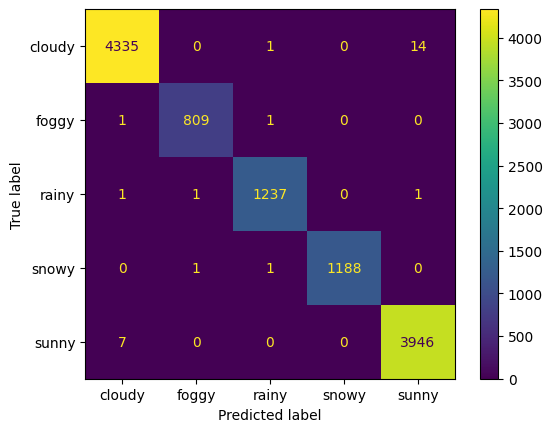

              precision    recall  f1-score   support

      cloudy       1.00      1.00      1.00      4350
       foggy       1.00      1.00      1.00       811
       rainy       1.00      1.00      1.00      1240
       snowy       1.00      1.00      1.00      1190
       sunny       1.00      1.00      1.00      3953

    accuracy                           1.00     11544
   macro avg       1.00      1.00      1.00     11544
weighted avg       1.00      1.00      1.00     11544



  0%|          | 0/1443 [00:00<?, ?it/s]

Fold: 1


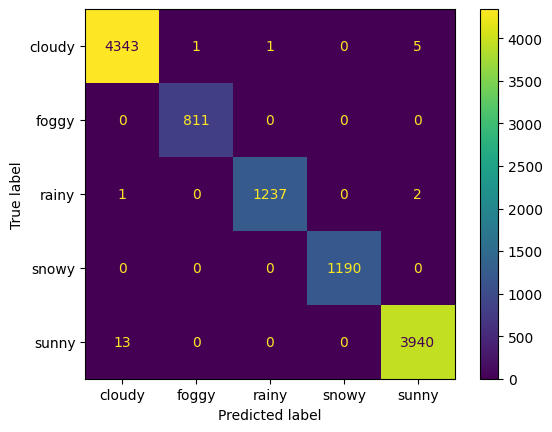

              precision    recall  f1-score   support

      cloudy       1.00      1.00      1.00      4350
       foggy       1.00      1.00      1.00       811
       rainy       1.00      1.00      1.00      1240
       snowy       1.00      1.00      1.00      1190
       sunny       1.00      1.00      1.00      3953

    accuracy                           1.00     11544
   macro avg       1.00      1.00      1.00     11544
weighted avg       1.00      1.00      1.00     11544



  0%|          | 0/1443 [00:00<?, ?it/s]

Fold: 2


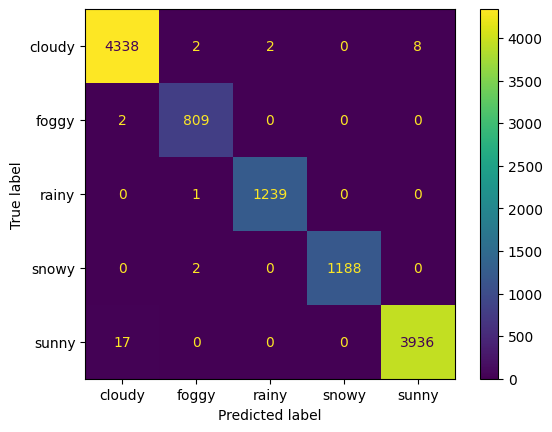

              precision    recall  f1-score   support

      cloudy       1.00      1.00      1.00      4350
       foggy       0.99      1.00      1.00       811
       rainy       1.00      1.00      1.00      1240
       snowy       1.00      1.00      1.00      1190
       sunny       1.00      1.00      1.00      3953

    accuracy                           1.00     11544
   macro avg       1.00      1.00      1.00     11544
weighted avg       1.00      1.00      1.00     11544



  0%|          | 0/1443 [00:00<?, ?it/s]

Fold: 3


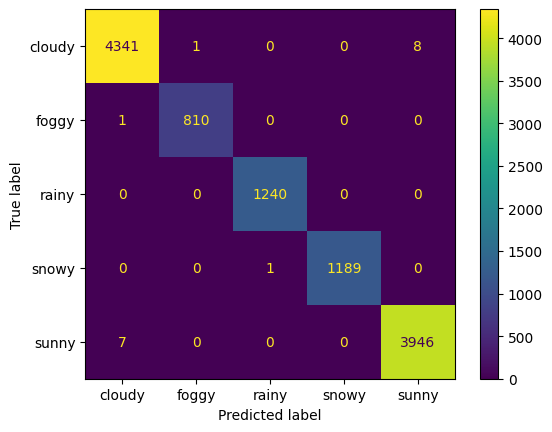

              precision    recall  f1-score   support

      cloudy       1.00      1.00      1.00      4350
       foggy       1.00      1.00      1.00       811
       rainy       1.00      1.00      1.00      1240
       snowy       1.00      1.00      1.00      1190
       sunny       1.00      1.00      1.00      3953

    accuracy                           1.00     11544
   macro avg       1.00      1.00      1.00     11544
weighted avg       1.00      1.00      1.00     11544



  0%|          | 0/1443 [00:00<?, ?it/s]

Fold: 4


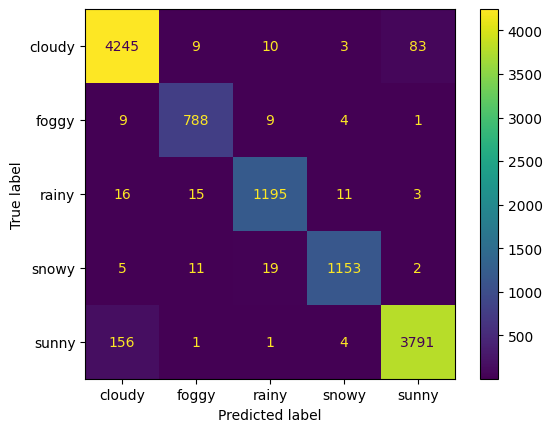

              precision    recall  f1-score   support

      cloudy       0.96      0.98      0.97      4350
       foggy       0.96      0.97      0.96       811
       rainy       0.97      0.96      0.97      1240
       snowy       0.98      0.97      0.98      1190
       sunny       0.98      0.96      0.97      3953

    accuracy                           0.97     11544
   macro avg       0.97      0.97      0.97     11544
weighted avg       0.97      0.97      0.97     11544



In [28]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model เปลี่ยนนนนนนนนนนชื่อตามด้านบน ก็อปมาทั้งfold
    loaded_model = torch.load(f"efficientnet_b0_checkpoint_fold{fold}.pt", weights_only=False)

    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(val_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))


In [29]:
classname = dataset.classes
classname

['cloudy', 'foggy', 'rainy', 'snowy', 'sunny']

###Verification by sepreate data

In [30]:
test_folder = '/content/test_augmented'

In [31]:
# Making Dataset
from torchvision import datasets
test_dataset = datasets.ImageFolder(root=test_folder, # target folder of images
                                  transform=transforms["test"], # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

In [32]:
len(test_dataset)

14431

In [33]:
# Making test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=4, pin_memory=True)

In [34]:
test_dataset.classes

['cloudy', 'foggy', 'rainy', 'snowy', 'sunny']

In [35]:
len(test_dataloader)

1804

  0%|          | 0/1804 [00:00<?, ?it/s]

Fold: 0


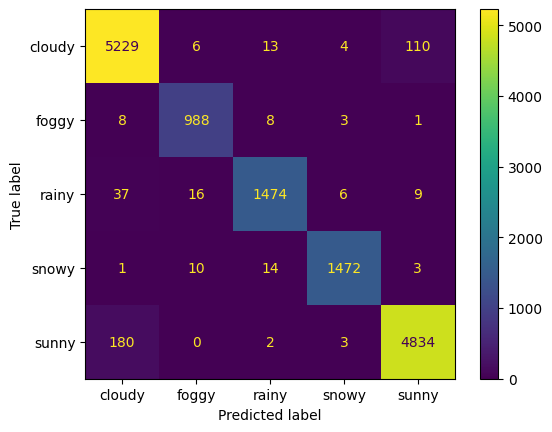

              precision    recall  f1-score   support

      cloudy       0.96      0.98      0.97      5362
       foggy       0.97      0.98      0.97      1008
       rainy       0.98      0.96      0.97      1542
       snowy       0.99      0.98      0.99      1500
       sunny       0.98      0.96      0.97      5019

    accuracy                           0.97     14431
   macro avg       0.97      0.97      0.97     14431
weighted avg       0.97      0.97      0.97     14431



  0%|          | 0/1804 [00:00<?, ?it/s]

Fold: 1


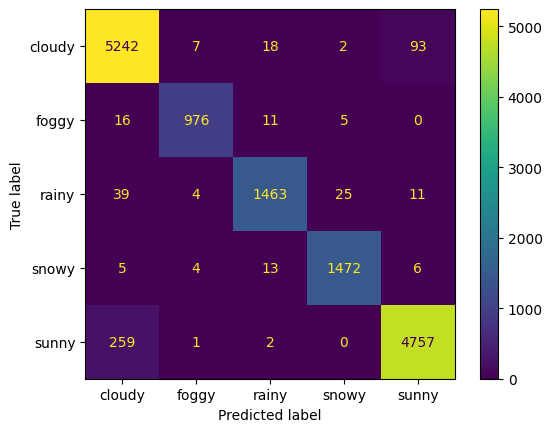

              precision    recall  f1-score   support

      cloudy       0.94      0.98      0.96      5362
       foggy       0.98      0.97      0.98      1008
       rainy       0.97      0.95      0.96      1542
       snowy       0.98      0.98      0.98      1500
       sunny       0.98      0.95      0.96      5019

    accuracy                           0.96     14431
   macro avg       0.97      0.96      0.97     14431
weighted avg       0.96      0.96      0.96     14431



  0%|          | 0/1804 [00:00<?, ?it/s]

Fold: 2


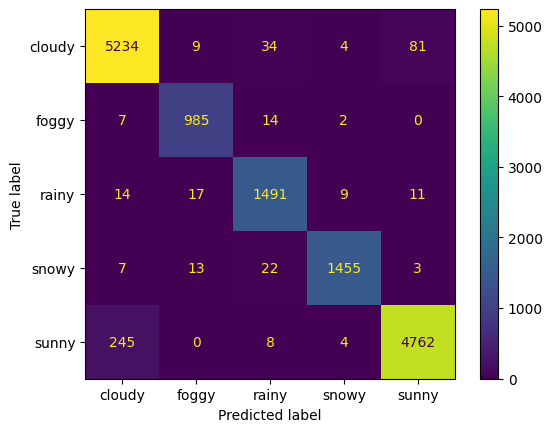

              precision    recall  f1-score   support

      cloudy       0.95      0.98      0.96      5362
       foggy       0.96      0.98      0.97      1008
       rainy       0.95      0.97      0.96      1542
       snowy       0.99      0.97      0.98      1500
       sunny       0.98      0.95      0.96      5019

    accuracy                           0.97     14431
   macro avg       0.97      0.97      0.97     14431
weighted avg       0.97      0.97      0.97     14431



  0%|          | 0/1804 [00:00<?, ?it/s]

Fold: 3


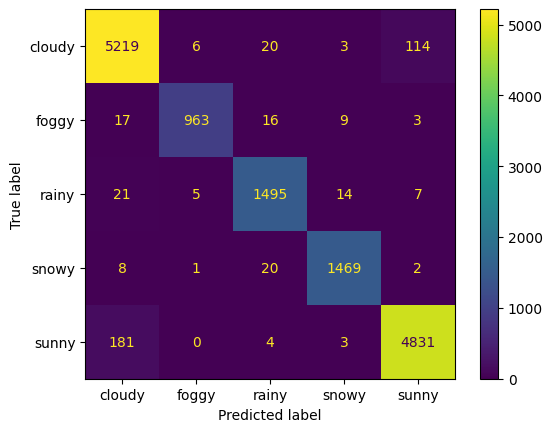

              precision    recall  f1-score   support

      cloudy       0.96      0.97      0.97      5362
       foggy       0.99      0.96      0.97      1008
       rainy       0.96      0.97      0.97      1542
       snowy       0.98      0.98      0.98      1500
       sunny       0.97      0.96      0.97      5019

    accuracy                           0.97     14431
   macro avg       0.97      0.97      0.97     14431
weighted avg       0.97      0.97      0.97     14431



  0%|          | 0/1804 [00:00<?, ?it/s]

Fold: 4


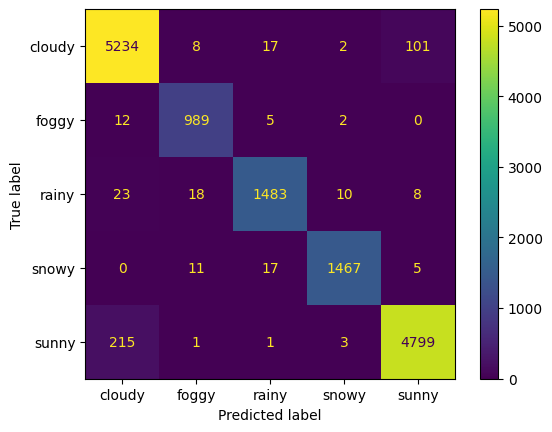

              precision    recall  f1-score   support

      cloudy       0.95      0.98      0.97      5362
       foggy       0.96      0.98      0.97      1008
       rainy       0.97      0.96      0.97      1542
       snowy       0.99      0.98      0.98      1500
       sunny       0.98      0.96      0.97      5019

    accuracy                           0.97     14431
   macro avg       0.97      0.97      0.97     14431
weighted avg       0.97      0.97      0.97     14431



In [36]:
for fold in range(k_splits):
    predictions = []
    references = []

    # load model เปลี่ยนตรงนี้ด้วยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยยอีควาย
    loaded_model = torch.load(f"efficientnet_b0_checkpoint_fold{fold}.pt", weights_only=False)

    # Evaluation
    loaded_model.eval()
    with torch.no_grad():
        for batch in tqdm(test_dataloader):
            inputs, targets = batch
            outputs = loaded_model(inputs.to(device))

            # Log Values
            predictions += outputs.argmax(-1).detach().cpu().tolist()
            references += targets.tolist()

    print(f"Fold: {fold}")

    # Confusion matrix
    cm = confusion_matrix(references, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classname)
    disp.plot()
    plt.show()

    # Classification Report
    print(classification_report(references, predictions, target_names=classname))


##Visualization train model result

In [37]:
## Making Pridcition return class & prob
from typing import List, Tuple

from PIL import Image
def pred_class(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: T = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path)

    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    classname =  class_names[target_image_pred_label]
    prob = target_image_pred_probs.max().cpu().numpy()

    return classname , prob

In [38]:
##Load some model วางตรงนี้ด้วยยยยยยยยยยย +fold0
loaded_model = torch.load('efficientnet_b0_checkpoint_fold0.pt', weights_only=False)

##Train data visulization

In [39]:
#Making df for random
import os
import pandas as pd
from PIL import Image

# create an empty list to store image paths
image_paths = []

# loop through each subfolder in the "Image" directory
for root, dirs, files in os.walk('test_augmented'):
    for subfolder_name in dirs:
        # get the path to the subfolder
        subfolder_path = os.path.join(root, subfolder_name)
        # loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, filename)
            image_paths.append((image_path, subfolder_name))

# create a DataFrame from the list of image paths
df = pd.DataFrame(image_paths, columns=['path', 'subfolder_name'])


In [40]:
df.head()

,path,subfolder_name
0,test_augmented/cloudy/c1351_shx20.jpeg,cloudy
1,test_augmented/cloudy/13767643_zm120pct.jpeg,cloudy
2,test_augmented/cloudy/c2668_hflip.jpeg,cloudy
3,test_augmented/cloudy/c2161_zm120pct.jpeg,cloudy
4,test_augmented/cloudy/c0897_zm120pct.jpeg,cloudy


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image



def sample_picture(df=df,random_state=None):
    # Sample 20 random rows from the DataFrame
    sample_df = df.sample(20, random_state=random_state).copy()
    sample_df = sample_df.reset_index(drop=True)
    # Define the grid layout for displaying the images
    num_rows = 4
    num_cols = 5
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 12))
    fig.tight_layout(pad=5.0)

    # Iterate over the sampled rows and display the images in the grid
    for i, row in sample_df.iterrows():
        img = Image.open(row['path'])

        # Prediction
        pred_name , prob = pred_class(model=loaded_model,image_path=row['path'],
                   class_names = classname,
                   transform=transforms["test"])

        row_idx = i // num_cols
        col_idx = i % num_cols
        axs[row_idx, col_idx].imshow(img)
        axs[row_idx, col_idx].axis('on')
        axs[row_idx, col_idx].set_title(row['subfolder_name'] + ': \nPredict:' + pred_name + '\nProb:'+ str(prob.round(decimals=2)) )

        # prediction


    plt.show()

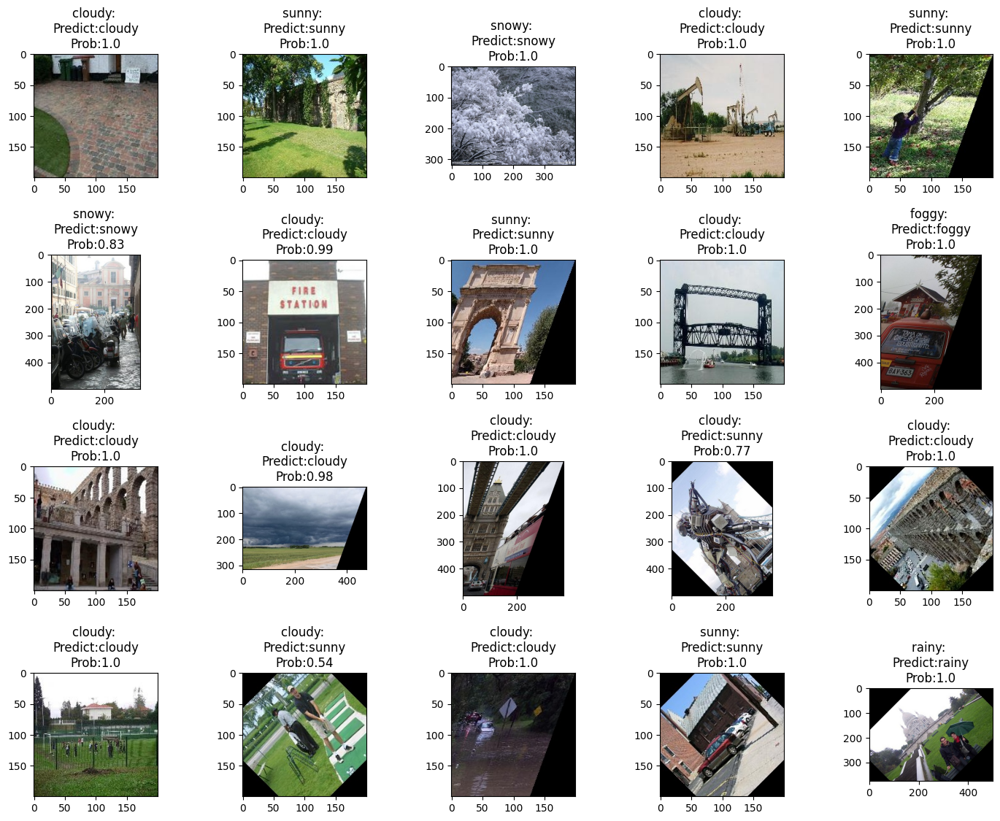

In [42]:
sample_picture()

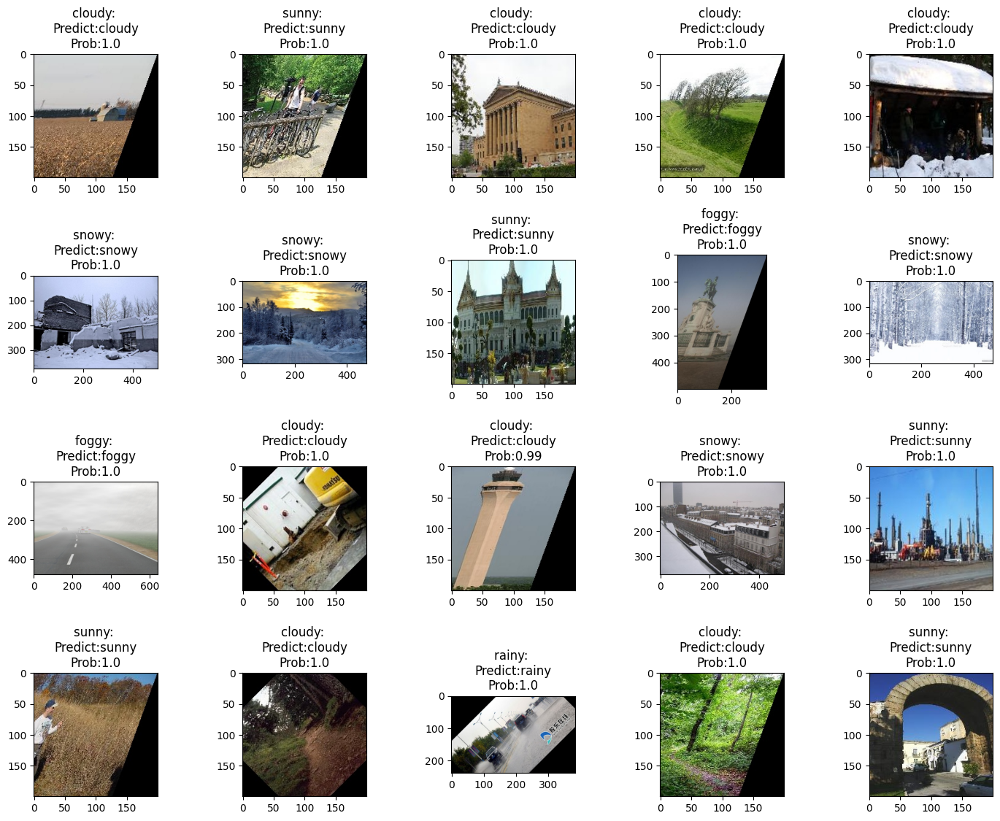

In [43]:
sample_picture()

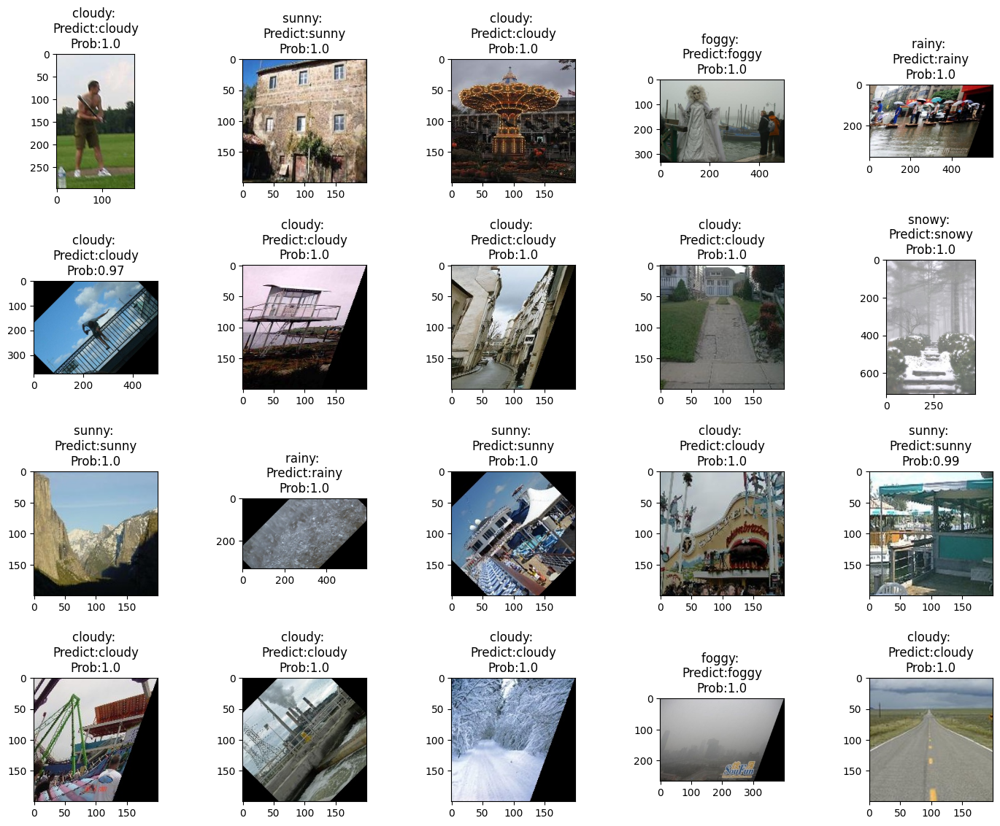

In [44]:
sample_picture()

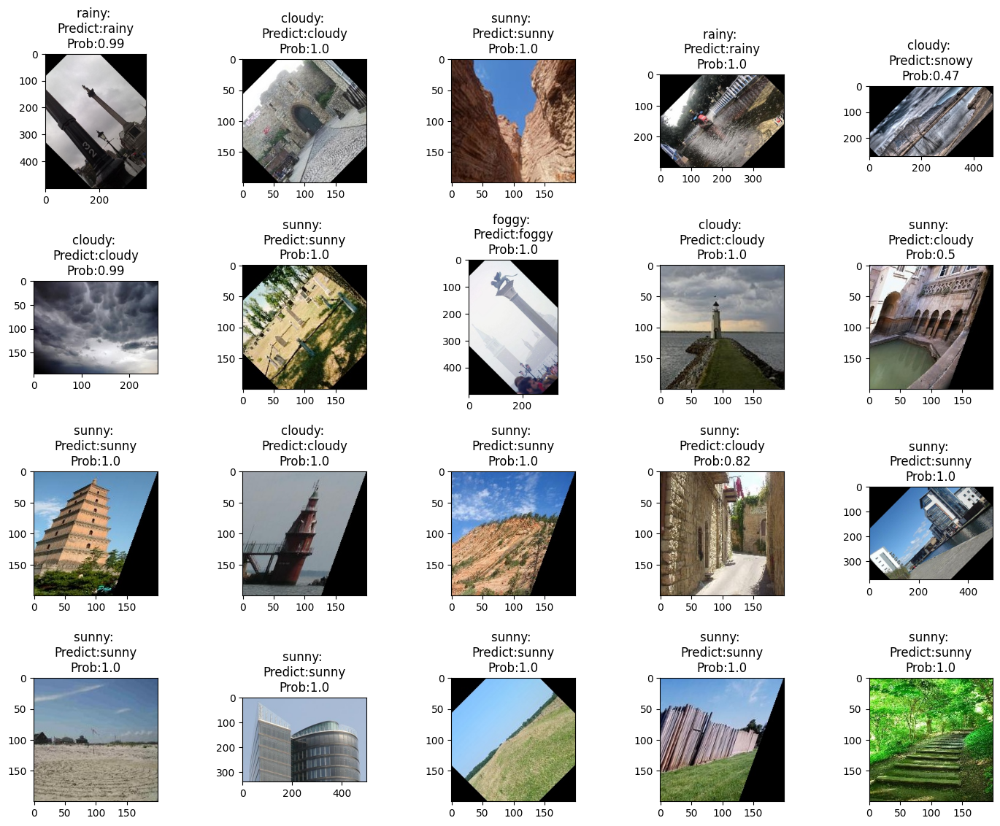

In [45]:
sample_picture()

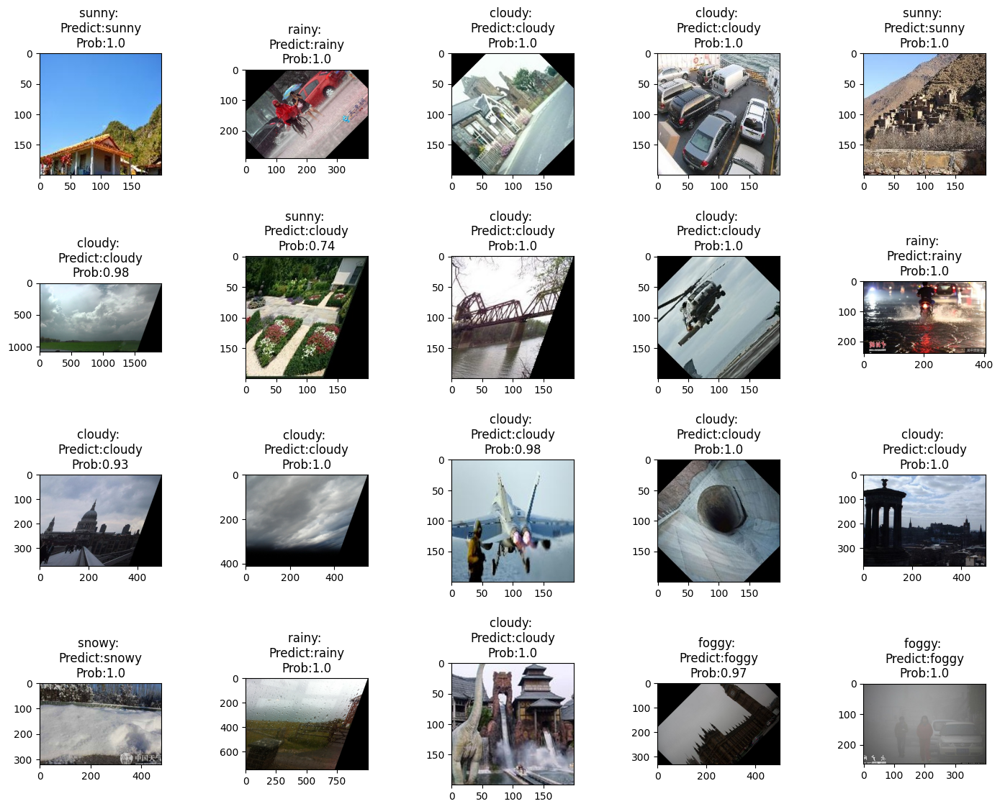

In [46]:
sample_picture()

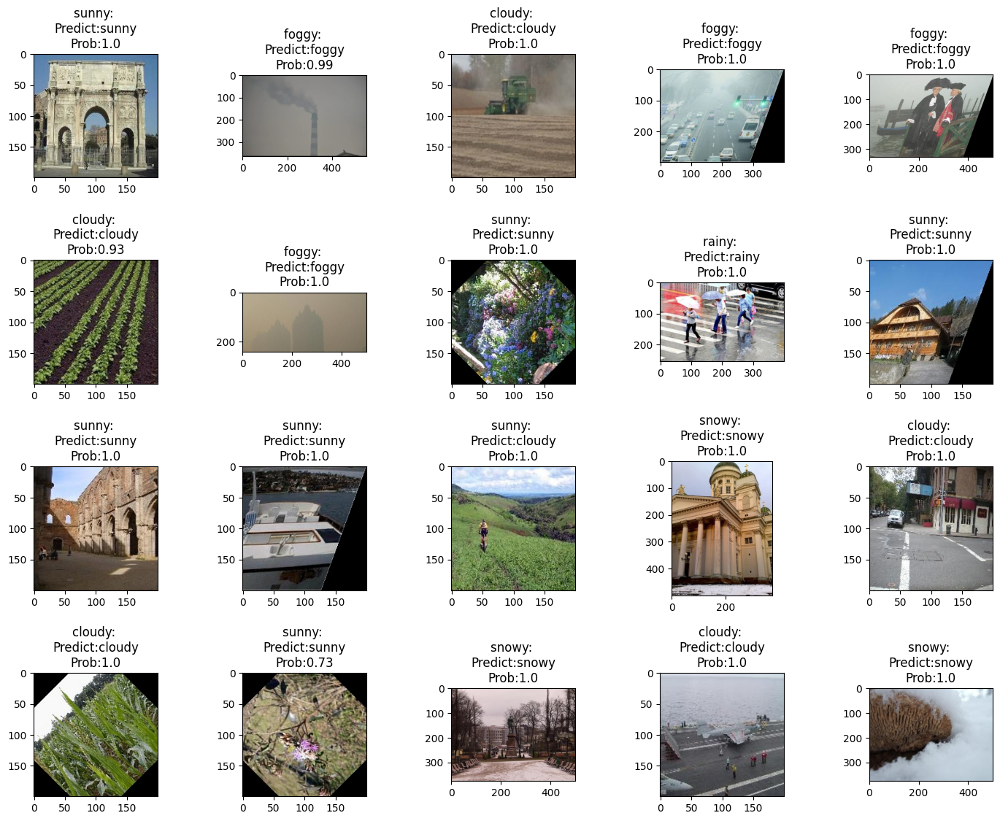

In [47]:
sample_picture()